In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import networkx as nx
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import json
import re
from shapely.geometry import Point, LineString
from scipy.spatial import distance
import osmnx as ox

### Load London Underground shapefile data

In [26]:
# load bus stop data
bus_stops = gpd.read_file('data/raw/tfl/Bus_Stops.geojson')
bus_stops = bus_stops.to_crs(epsg=27700)
# CONVERT STOP_CODE TO STR
bus_stops['STOP_CODE'] = bus_stops['STOP_CODE'].astype(str).str.strip()
bus_stops.head()

,OBJECTID,STOP_NAME,STOP_CODE,COUNTDOWN_SIGN,NAPTAN_ATCO,ROAD_NAME,POINT_LETTER,ROUTES,LIVE_BUS_ARRIVAL,OS_EASTING,OS_NORTHING,POSTCODE,DATE_UPDATED,geometry
0,627,Northumberland Park Bus Stand,BP4641,None,None,NORTHUMBERLAND PARK,None,None,https://tfl.gov.uk/bus/stop//,534761,191137,N17 0LB,2023-08-09 00:00:00+00:00,POINT (534761.001 191137.000)
1,780,Hyde Park Corner,BP4661,None,None,PICCADILLY,None,None,https://tfl.gov.uk/bus/stop//,528623,179941,W1J 9DZ,2023-08-09 00:00:00+00:00,POINT (528623.001 179941.000)
2,2401,Hampton Court Station,BP5447,None,None,HAMPTON COURT STATION FORECOURT,AP,None,https://tfl.gov.uk/bus/stop//,515372,168407,KT8 9AE,2023-08-09 00:00:00+00:00,POINT (515372.001 168407.000)
3,2951,Birkbeck,TRS162,None,9400ZZCRBIR1,HARRINGTON ROAD - BIRKBECK,None,T2,https://tfl.gov.uk/bus/stop/9400ZZCRBIR1/,535302,168966,SE20 7YA,2023-08-09 00:00:00+00:00,POINT (535302.001 168966.000)
4,3016,Avenue Road,TRS164,None,9400ZZCRAVE1,AVENUE ROAD,None,T2,https://tfl.gov.uk/bus/stop/9400ZZCRAVE1/,535744,169323,BR3 4SB,2023-08-09 00:00:00+00:00,POINT (535744.001 169323.000)


In [3]:
# create bus_edges
bus_segments = gpd.read_file(os.path.join('data','raw','tfl','Bus_Routes_(stop_to_stop_segments).geojson'))
bus_segments = bus_segments.to_crs(epsg=27700)

In [4]:
# parse the CODE_S2S column to get the stop_id1 and stop_id2, delimiter is ' TO '
bus_segments['stop_id1'] = bus_segments['CODE_S2S'].apply(lambda x: x.split(' TO ')[0])
bus_segments['stop_id2'] = bus_segments['CODE_S2S'].apply(lambda x: x.split(' TO ')[1])
bus_segments.head()

,OBJECTID,NAME_S2S,CODE_S2S,RTE_RUNS,LAST_EDITED,EDITED_BY,STATISTICS_PERIOD,M_F_AM_TOTAL,M_F_IN_TOTAL,M_F_PM_TOTAL,...,SAT_LE,SUN_EM,SUN_AM,SUN_IN,SUN_PM,SUN_LE,Shape__Length,geometry,stop_id1,stop_id2
0,591467,Whitgift Centre TO Fairfield Halls,10814 TO 33308,75 RUN1,2024-06-14 11:08:58+00:00,NMGIS,week_20240601_20240607,4.27,4.24,4.47,...,3.5 [75 RUN1],2.34 [75 RUN1],3 [75 RUN1],3.34 [75 RUN1],4 [75 RUN1],3 [75 RUN1],463.287448,"LINESTRING (532422.714 165930.374, 532425.865 ...",10814,33308
1,591468,Southampton Row / Theobald's Road TO Kingsway ...,25599 TO 26425,"1 RUN1,68 RUN2,91 RUN1,N91 RUN1,SL6 RUN2",2024-06-14 11:09:24+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,"0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...","0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...","0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...","0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...","0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...","0 [1 RUN1], 0 [68 RUN2], 0 [91 RUN1], 0 [N91 R...",214.030875,"LINESTRING (530489.826 181626.466, 530492.317 ...",25599,26425
2,591469,Croydon Bowling Club TO Warham Road / Brighton...,BP1031 TO R0523,"119 RUN2,405 RUN1,645 RUN1",2024-06-14 11:09:51+00:00,NMGIS,week_20240601_20240607,8.20,8.34,8.21,...,"3.5 [119 RUN2], 2 [405 RUN1], [645 RUN1]","1.17 [119 RUN2], 0.17 [405 RUN1], [645 RUN1]","2.34 [119 RUN2], 2 [405 RUN1], [645 RUN1]","4.17 [119 RUN2], 1.84 [405 RUN1], [645 RUN1]","4 [119 RUN2], 2.34 [405 RUN1], [645 RUN1]","3.34 [119 RUN2], 1.67 [405 RUN1], [645 RUN1]",272.117474,"LINESTRING (532131.208 164335.189, 532135.633 ...",BP1031,R0523
3,591470,Meopham Road / Woodstock Way TO Ebenezer Walk,BP4603 TO BP4604,463 RUN2,2024-06-14 11:10:01+00:00,NMGIS,week_20240601_20240607,3.07,2.90,2.67,...,1.84 [463 RUN2],0.34 [463 RUN2],2 [463 RUN2],2 [463 RUN2],2 [463 RUN2],1.67 [463 RUN2],249.742579,"LINESTRING (529228.548 169481.435, 529228.001 ...",BP4603,BP4604
4,591471,Village Road TO Ronan Way,BP874 TO BP866,331 RUN1,2024-06-14 11:10:07+00:00,NMGIS,week_20240601_20240607,3.00,2.90,3.00,...,1.84 [331 RUN1],0.17 [331 RUN1],1.34 [331 RUN1],1.67 [331 RUN1],2 [331 RUN1],1.67 [331 RUN1],389.576700,"LINESTRING (503706.421 186879.566, 503705.192 ...",BP874,BP866


In [5]:
# parse the RTE_RUNS column to get the routes served

# replace 'RUN1', 'RUN2', 'RUN1,' 'RUN2,' with ''
bus_segments['routes'] = bus_segments['RTE_RUNS'].apply(lambda x: re.sub(r'RUN[0-9]+,?', '', x))
bus_segments['routes'] = bus_segments['routes'].apply(lambda x: x.strip()) # trim space
# split the string by ' ' put into a list
bus_segments['routes'] = bus_segments['routes'].apply(lambda x: x.split(' '))
bus_segments.shape

(25000, 30)

In [6]:
# For each of the route, create a new row
bus_segments = bus_segments.explode('routes')
bus_segments.reset_index(drop=True, inplace=True)
bus_segments.shape

(57832, 30)

In [7]:
bus_segments.tail()

,OBJECTID,NAME_S2S,CODE_S2S,RTE_RUNS,LAST_EDITED,EDITED_BY,STATISTICS_PERIOD,M_F_AM_TOTAL,M_F_IN_TOTAL,M_F_PM_TOTAL,...,SUN_EM,SUN_AM,SUN_IN,SUN_PM,SUN_LE,Shape__Length,geometry,stop_id1,stop_id2,routes
57827,616463,Gravel Hill TO St Mary's Avenue,BP2834 TO 16497,"125 RUN1,143 RUN2,326 RUN1,643 RUN2,653 RUN1,6...",2024-06-14 11:09:56+00:00,NMGIS,week_20240601_20240607,15.01,15.31,16.41,...,"1.17 [125 RUN1], 0.67 [143 RUN2], 0.67 [326 RU...","3 [125 RUN1], 2.67 [143 RUN2], 2.67 [326 RUN1]...","3.67 [125 RUN1], 3.84 [143 RUN2], 4.17 [326 RU...","3.67 [125 RUN1], 4 [143 RUN2], 3.67 [326 RUN1]...","3.17 [125 RUN1], 3.34 [143 RUN2], 3.5 [326 RUN...",277.559528,"LINESTRING (524867.224 190300.439, 524864.459 ...",BP2834,16497,683
57828,616464,Locksbottom / St Michael's Church TO Princess ...,18943 TO BP4333,"R3 RUN2,R4 RUN1",2024-06-14 11:09:17+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,"0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]",637.718884,"LINESTRING (543106.001 165086.000, 543098.454 ...",18943,BP4333,R3
57829,616464,Locksbottom / St Michael's Church TO Princess ...,18943 TO BP4333,"R3 RUN2,R4 RUN1",2024-06-14 11:09:17+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,"0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]","0 [R3 RUN2], [R4 RUN1]",637.718884,"LINESTRING (543106.001 165086.000, 543098.454 ...",18943,BP4333,R4
57830,616465,Dolman Road TO The Orchard,R0865 TO 11345,272 RUN1,2024-06-14 11:10:16+00:00,NMGIS,week_20240601_20240607,0.00,0.00,0.00,...,0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],0 [272 RUN1],510.990239,"LINESTRING (520804.507 178540.332, 520809.001 ...",R0865,11345,272
57831,616466,Beaufort Gardens TO Prince Charles Drive,15750 TO 35208,324 RUN1,2024-06-14 11:09:07+00:00,NMGIS,week_20240601_20240607,2.74,2.94,2.87,...,0.34 [324 RUN1],1.67 [324 RUN1],2.5 [324 RUN1],2.67 [324 RUN1],1.84 [324 RUN1],795.337850,"LINESTRING (523063.269 188268.414, 523065.849 ...",15750,35208,324


In [8]:
bus_segments.shape

(57832, 30)

In [9]:
# filter for only rows in bus_segments that have a stop_id1 or stop_id2 that are in bus_stops
bus_segments = bus_segments[bus_segments['stop_id1'].isin(bus_stops['STOP_CODE']) | bus_segments['stop_id2'].isin(bus_stops['STOP_CODE'])]
bus_segments.shape

(57752, 30)

In [10]:
bus_stops[bus_stops['STOP_CODE'] == 'BP6186']

,OBJECTID,STOP_NAME,STOP_CODE,COUNTDOWN_SIGN,NAPTAN_ATCO,ROAD_NAME,POINT_LETTER,ROUTES,LIVE_BUS_ARRIVAL,OS_EASTING,OS_NORTHING,POSTCODE,DATE_UPDATED,geometry


In [11]:
bus_network = nx.from_pandas_edgelist(
    bus_segments,
    source = 'stop_id1',
    target = 'stop_id2',
    edge_attr = ['routes','Shape__Length', 'geometry'],
    create_using = nx.MultiDiGraph()
)

# add the route attribute to the edges
for u,v,data in bus_network.edges(data=True):
    data['route'] = data['routes']
    data['length'] = data['Shape__Length']
    data['geometry'] = data['geometry']

# add the stop_id as node attribute
for n in bus_network.nodes():
    bus_network.nodes[n]['stop_id'] = n

no_pos = []

# add stop_name as node attribute in bus_network
for n in bus_network.nodes():
    n = n.strip()
    if n not in bus_stops.STOP_CODE.values:
        print(f'{n} not in bus_stops')
        # add to a list
        no_pos.append(n)
    else:
        bus_network.nodes[n]['stop_name'] = bus_stops[bus_stops.STOP_CODE == n].iloc[0]['STOP_NAME']


H0982 not in bus_stops
BP6501 not in bus_stops
H0778 not in bus_stops
20394 not in bus_stops
BP5024 not in bus_stops
BP6449 not in bus_stops
H0935 not in bus_stops
H1145 not in bus_stops
BP4407 not in bus_stops
RR20 not in bus_stops
BP2617 not in bus_stops
H1151 not in bus_stops
H0133 not in bus_stops
OC326 not in bus_stops
H1148 not in bus_stops
169 not in bus_stops
25922 not in bus_stops
H1239 not in bus_stops
H0974 not in bus_stops
H0779 not in bus_stops
H0807 not in bus_stops
BP5773 not in bus_stops
11652 not in bus_stops
BP2200 not in bus_stops
H0919 not in bus_stops
H1226 not in bus_stops
H0736 not in bus_stops
H1282 not in bus_stops
174 not in bus_stops
OC551 not in bus_stops
H0922 not in bus_stops
BP5634 not in bus_stops
OC562 not in bus_stops
H0007 not in bus_stops
H1149 not in bus_stops
29071 not in bus_stops
H1147 not in bus_stops
BP1037 not in bus_stops
H0791 not in bus_stops
H0632 not in bus_stops
29899 not in bus_stops
OC329 not in bus_stops
BP6186 not in bus_stops
RR19 n

In [12]:
len(no_pos)
# 150 stops are not in bus_stops, no geometry information

103

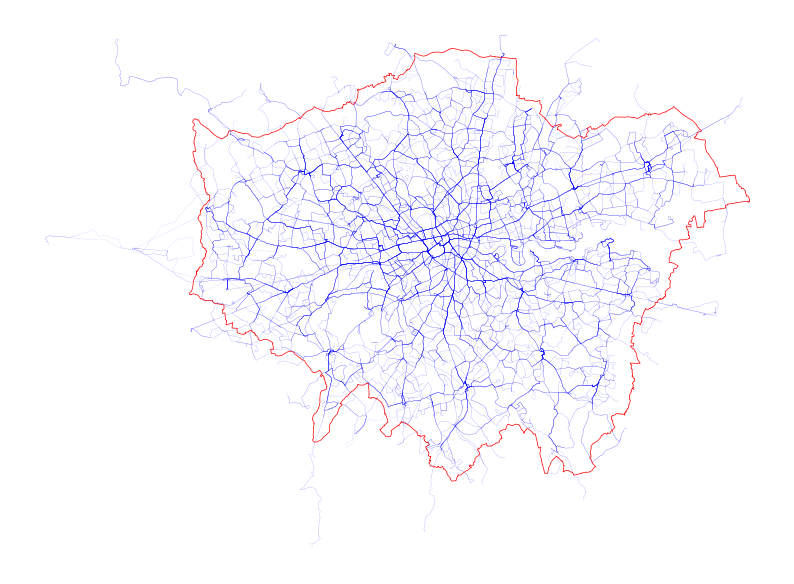

In [13]:
london = ox.geocode_to_gdf('Greater London, UK')
london.to_crs(epsg=27700, inplace=True)

# plot the bus_network
fig, ax = plt.subplots(figsize=(10,10))
bus_segments.plot(ax=ax, color='blue', linewidth=0.2, alpha=0.2)
london.boundary.plot(ax=ax, color='red', linewidth=0.5)
plt.axis('off')
plt.show()

In [14]:
# how many connected components
print(nx.number_connected_components(bus_network.to_undirected()))

10


In [15]:
pos = {row['STOP_NAME']: row.geometry.coords[0] for i, row in bus_stops.iterrows() if row['STOP_CODE'] in bus_network.nodes()}

# Gcc = nx.connected_components(bus_network.to_undirected()) # 9 connected components

# for n in Gcc:
#     G_sub = bus_network.subgraph(n)
#     lines = [data['route'] for u,v, data in G_sub.edges(data=True)]
#     print(set(lines))
#     # only plot if node has pos
#     nx.draw(G_sub, node_size=1, edge_color='gray', node_color='red', with_labels=False)
#     plt.show()
#     #stop after first connected component
#     break

# Centrality Measures

Use degree, betweenness, closeness (topological) and katz 

In [16]:
G = bus_network.to_undirected()

In [17]:
%%time
# Degree centrality is a measure of the number of edges that a node has in the network. 
# It is a measure of how well connected a node is in the network.
deg_london =nx.degree_centrality(G)
nx.set_node_attributes(G,dict(deg_london),'degree')

# Betweenness centrality is a measure of how many times a node lies on the shortest path between other nodes in the network.
bet_london_t=nx.betweenness_centrality(G, normalized=False)
nx.set_node_attributes(G,bet_london_t,'betweenness_t')

# Closeness centrality is a measure of how close a node is to all other nodes in the network.
clo_london_t=nx.closeness_centrality(G)
nx.set_node_attributes(G,clo_london_t,'closeness_t')

# PageRank is a measure of the importance of a node in the network.
pr_london_t=nx.pagerank(G)
nx.set_node_attributes(G,pr_london_t,'pagerank_t')

CPU times: total: 8min 21s
Wall time: 47min 48s


In [18]:
# Combine all the centrality measures into one dataframe
df = pd.DataFrame()
df['STOP_NAME'] = pd.Series(nx.get_node_attributes(G, 'stop_name'))
df['degree'] = pd.Series(nx.get_node_attributes(G, 'degree'))
df['betweenness_t'] = pd.Series(nx.get_node_attributes(G, 'betweenness_t'))
df['closeness_t'] = pd.Series(nx.get_node_attributes(G, 'closeness_t'))
df['pagerank_t'] = pd.Series(nx.get_node_attributes(G, 'pagerank_t'))

In [25]:
df_sorted = df.sort_values(["betweenness_t"], ascending=False)
df_sorted[0:15]

,STOP_NAME,degree,betweenness_t,closeness_t,pagerank_t
6007,North Acton Station,0.000999,4.618171e+07,0.042323,0.000137
37323,Hatton Cross Station,0.000600,3.734770e+07,0.040227,0.000084
RR64,Heathrow Central,0.000250,3.584708e+07,0.040791,0.000054
BP5004,Hammersmith Bus Station,0.000500,3.579126e+07,0.041455,0.000049
19484,Broad Street / Teddington,0.000899,3.410684e+07,0.039494,0.000123
BP497,Wood Street,0.000500,3.245739e+07,0.038784,0.000079
31468,Kingston Station,0.000400,3.128423e+07,0.038121,0.000053
688,Ealing Common Station,0.001099,3.015367e+07,0.042324,0.000110
27387,New Malden / Kingston Road,0.000600,2.870878e+07,0.037530,0.000093
4909,Brondesbury Station,0.000999,2.654140e+07,0.041580,0.000087


In [35]:
# reset index, set old index name to STOP_CODE
df_sorted.reset_index(inplace=True)
df_sorted.rename(columns={'index':'STOP_CODE'}, inplace=True)
df_sorted.head()

,STOP_CODE,STOP_NAME,degree,betweenness_t,closeness_t,pagerank_t
0,6007,North Acton Station,0.000999,4.618171e+07,0.042323,0.000137
1,37323,Hatton Cross Station,0.000600,3.734770e+07,0.040227,0.000084
2,RR64,Heathrow Central,0.000250,3.584708e+07,0.040791,0.000054
3,BP5004,Hammersmith Bus Station,0.000500,3.579126e+07,0.041455,0.000049
4,19484,Broad Street / Teddington,0.000899,3.410684e+07,0.039494,0.000123


In [43]:
# merge df_sorted with bus_stops (geometry)
bus_stops_cent = pd.merge(bus_stops[['STOP_CODE', 'geometry']], df_sorted, on='STOP_CODE', how='inner')
bus_stops_cent.head()

,STOP_CODE,geometry,STOP_NAME,degree,betweenness_t,closeness_t,pagerank_t
0,H0429,POINT (543649.001 167309.000),Hail Ride Faringdon Ave / Chesham Ave,0.0002,65925.382953,0.020675,0.000055
1,H1000,POINT (517601.001 181724.000),Hail Ride Montpelier Road,0.0001,51256.884244,0.035238,0.000031
2,H0557,POINT (545124.001 162756.000),Hail Ride Cudham Lane North,0.0002,82.000000,0.000112,0.000053
3,H1280,POINT (529031.001 159839.000),Lynwood Avenue,0.0003,298920.000000,0.021146,0.000054
4,H1279,POINT (528915.001 159935.000),Beechwood Avenue,0.0003,259090.500000,0.020286,0.000059


In [44]:
# convert to hexagon resolution 9 using h3
import h3
import h3pandas

df_hex = bus_stops_cent.copy()
df_hex.to_crs(epsg=4326, inplace=True)	
df_hex = df_hex.h3.geo_to_h3(resolution=10)
df_hex = df_hex.h3.h3_to_geo_boundary()

In [45]:
df_hex.explore()

In [46]:
df_hex.to_crs(epsg=27700, inplace=True)	

In [47]:
df_hex.to_file(os.path.join('data','cleaned','bus_cent_h3_r10.gpkg'), driver='GPKG')